In [2]:
import math
import statistics
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import scipy
from scipy.stats import chi2_contingency
from scipy import stats as st

male_players=pd.read_csv("C:/Users/manda/Downloads/male_players.csv")
print(male_players.head())
print(male_players.shape) #--- 16161 rows 57 columns
print(male_players.info())

   Unnamed: 0  Rank             Name  OVR  PAC  SHO  PAS  DRI  DEF  PHY  ...  \
0           0     1    Kylian Mbappé   91   97   90   80   92   36   78  ...   
1           1     2            Rodri   91   66   80   86   84   87   85  ...   
2           2     4   Erling Haaland   91   88   92   70   81   45   88  ...   
3           3     5  Jude Bellingham   90   80   87   83   88   78   83  ...   
4           4     7         Vini Jr.   90   95   84   81   91   29   69  ...   

    Nation            League             Team  \
0   France  LALIGA EA SPORTS      Real Madrid   
1    Spain    Premier League  Manchester City   
2   Norway    Premier League  Manchester City   
3  England  LALIGA EA SPORTS      Real Madrid   
4   Brazil  LALIGA EA SPORTS      Real Madrid   

                                          play style  \
0  Quick Step+, Acrobatic, Finesse Shot, Flair, R...   
1  Tiki Taka+, Aerial, Bruiser, Long Ball Pass, P...   
2  Acrobatic+, Bruiser, Power Header, Power Shot,...   


In [3]:
print(male_players.columns)

Index(['Unnamed: 0', 'Rank', 'Name', 'OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF',
       'PHY', 'Acceleration', 'Sprint Speed', 'Positioning', 'Finishing',
       'Shot Power', 'Long Shots', 'Volleys', 'Penalties', 'Vision',
       'Crossing', 'Free Kick Accuracy', 'Short Passing', 'Long Passing',
       'Curve', 'Dribbling', 'Agility', 'Balance', 'Reactions', 'Ball Control',
       'Composure', 'Interceptions', 'Heading Accuracy', 'Def Awareness',
       'Standing Tackle', 'Sliding Tackle', 'Jumping', 'Stamina', 'Strength',
       'Aggression', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot',
       'Height', 'Weight', 'Alternative positions', 'Age', 'Nation', 'League',
       'Team', 'play style', 'url', 'GK Diving', 'GK Handling', 'GK Kicking',
       'GK Positioning', 'GK Reflexes'],
      dtype='object')


In [4]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 57


In [5]:
print(male_players.isnull().sum())

Unnamed: 0                   0
Rank                         0
Name                         0
OVR                          0
PAC                          0
SHO                          0
PAS                          0
DRI                          0
DEF                          0
PHY                          0
Acceleration                 0
Sprint Speed                 0
Positioning                  0
Finishing                    0
Shot Power                   0
Long Shots                   0
Volleys                      0
Penalties                    0
Vision                       0
Crossing                     0
Free Kick Accuracy           0
Short Passing                0
Long Passing                 0
Curve                        0
Dribbling                    0
Agility                      0
Balance                      0
Reactions                    0
Ball Control                 0
Composure                    0
Interceptions                0
Heading Accuracy             0
Def Awar

In [6]:
male_players = male_players.dropna(axis=1, thresh=len(male_players) - 1)
print(male_players.isnull().sum())

Unnamed: 0            0
Rank                  0
Name                  0
OVR                   0
PAC                   0
SHO                   0
PAS                   0
DRI                   0
DEF                   0
PHY                   0
Acceleration          0
Sprint Speed          0
Positioning           0
Finishing             0
Shot Power            0
Long Shots            0
Volleys               0
Penalties             0
Vision                0
Crossing              0
Free Kick Accuracy    0
Short Passing         0
Long Passing          0
Curve                 0
Dribbling             0
Agility               0
Balance               0
Reactions             0
Ball Control          0
Composure             0
Interceptions         0
Heading Accuracy      0
Def Awareness         0
Standing Tackle       0
Sliding Tackle        0
Jumping               0
Stamina               0
Strength              0
Aggression            0
Position              0
Weak foot             0
Skill moves     

In [7]:
#dropping unnamed column
male_players = male_players.drop(male_players.columns[0], axis=1)

In [8]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 49


In [9]:
# Detect duplicate rows
duplicates = male_players.duplicated()
print("\nDuplicate rows:")
print(duplicates)

# Remove duplicate rows
# You can use the drop_duplicates() method to remove duplicate rows from a DataFrame.
male_players_no_duplicates = male_players.drop_duplicates(inplace=True)
print("\nDataFrame after removing duplicate rows:")
print(male_players_no_duplicates)

# Detect duplicate columns
duplicate_columns = male_players.T.duplicated()
print("\nDuplicate columns:")
print(duplicate_columns)

# Remove duplicate columns
male_players_no_duplicate_columns = male_players.T.drop_duplicates(inplace=True)
print("\nDataFrame after removing duplicate columns:")
print(male_players_no_duplicate_columns)


Duplicate rows:
0        False
1        False
2        False
3        False
4        False
         ...  
16156    False
16157    False
16158    False
16159    False
16160    False
Length: 16161, dtype: bool

DataFrame after removing duplicate rows:
None

Duplicate columns:
Rank                  False
Name                  False
OVR                   False
PAC                   False
SHO                   False
PAS                   False
DRI                   False
DEF                   False
PHY                   False
Acceleration          False
Sprint Speed          False
Positioning           False
Finishing             False
Shot Power            False
Long Shots            False
Volleys               False
Penalties             False
Vision                False
Crossing              False
Free Kick Accuracy    False
Short Passing         False
Long Passing          False
Curve                 False
Dribbling             False
Agility               False
Balance               Fa

In [10]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 49


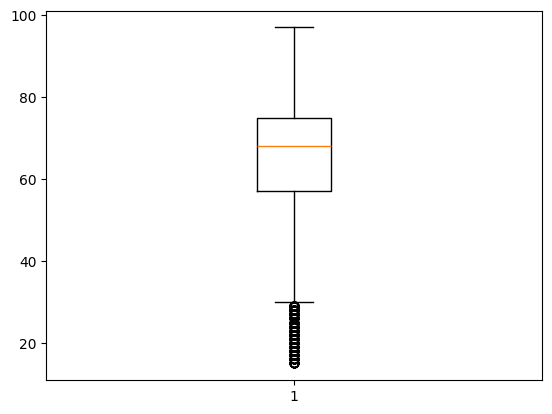

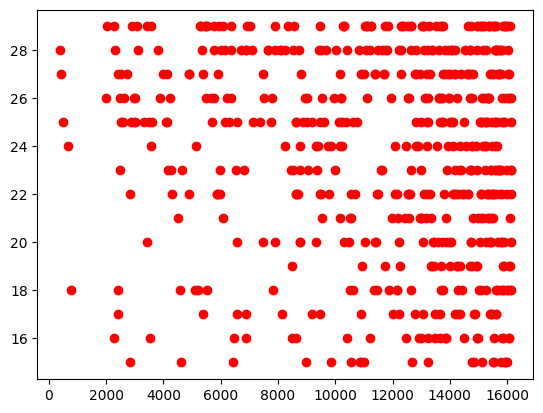

In [11]:
# Check for outliers
# Calculate the IQR for a specific column in the dataset
column_name = "Sprint Speed"
Q1 = male_players[column_name].quantile(0.25)
Q3 = male_players[column_name].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers as values outside the range (Q1 - 1.5 * IQR) to (Q3 + 1.5 * IQR)
outliers = male_players[(male_players[column_name] < (Q1 - 1.5 * IQR)) | (male_players[column_name] > (Q3 + 1.5 * IQR))]
# Plot the data and highlight the outliers
plt.boxplot(male_players[column_name])
plt.show()
plt.scatter(x=outliers.index, y=outliers[column_name], color='red')
plt.show()

In [12]:

# Lists to store different types of columns
cat = []        # Categorical columns
num = []        # Numerical columns
identifier = [] # Columns to exclude from cat/num

# Columns to exclude from categorical or numerical classification
exclude = ['Rank', 'url']

# Loop through each column in the dataset
for column in male_players.columns:
    if column in exclude:
        identifier.append(column)  # Add to identifier list if it's in the exclude list
    elif pd.api.types.is_numeric_dtype(male_players[column]):
        if male_players[column].nunique() > 10:
            num.append(column)  # Add to numerical list if it has more than 10 unique values
        else:
            cat.append(column)  # Otherwise, treat it as categorical
    else:
        cat.append(column)  # Non-numeric columns are treated as categorical

# Print out the categorized lists
print("Categorical columns:", cat)
print("Numerical columns:", num)
print("Identifier columns:", identifier)

Categorical columns: ['Name', 'Positioning', 'Finishing', 'Long Shots', 'Volleys', 'Crossing', 'Free Kick Accuracy', 'Curve', 'Dribbling', 'Interceptions', 'Heading Accuracy', 'Def Awareness', 'Standing Tackle', 'Sliding Tackle', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot', 'Height', 'Weight', 'Nation', 'League', 'Team']
Numerical columns: ['OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'Acceleration', 'Sprint Speed', 'Shot Power', 'Penalties', 'Vision', 'Short Passing', 'Long Passing', 'Agility', 'Balance', 'Reactions', 'Ball Control', 'Composure', 'Jumping', 'Stamina', 'Strength', 'Aggression', 'Age']
Identifier columns: ['Rank', 'url']


In [13]:
print(cat)
print(num)

print(len(cat))
print(len(num))

['Name', 'Positioning', 'Finishing', 'Long Shots', 'Volleys', 'Crossing', 'Free Kick Accuracy', 'Curve', 'Dribbling', 'Interceptions', 'Heading Accuracy', 'Def Awareness', 'Standing Tackle', 'Sliding Tackle', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot', 'Height', 'Weight', 'Nation', 'League', 'Team']
['OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'Acceleration', 'Sprint Speed', 'Shot Power', 'Penalties', 'Vision', 'Short Passing', 'Long Passing', 'Agility', 'Balance', 'Reactions', 'Ball Control', 'Composure', 'Jumping', 'Stamina', 'Strength', 'Aggression', 'Age']
23
24


In [14]:
#reducing the dataset size
df=male_players.head(10)

Text(0.5, 1.0, 'Number of Long Shots')

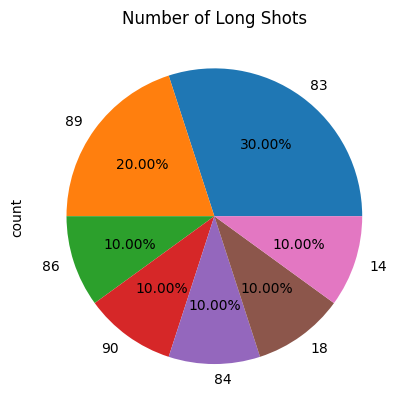

In [15]:
# UNIVARIATE ANALYSIS

# CATEGORICAL

df['Long Shots'].value_counts().plot(kind="pie",autopct="%1.2f%%")
plt.title('Number of Long Shots')


Text(0.5, 1.0, 'Mode of Long Shots')

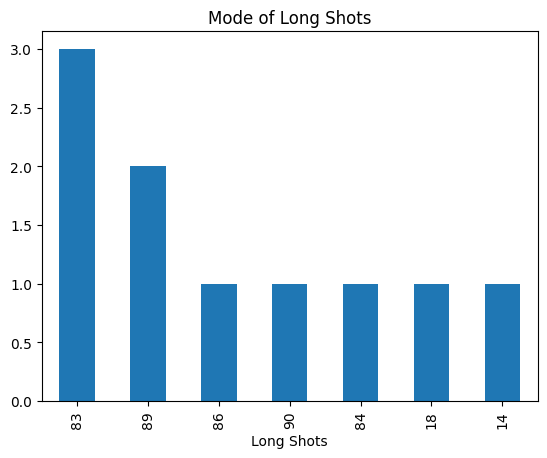

In [16]:
df['Long Shots'].value_counts().plot(kind="bar")
plt.title('Mode of Long Shots')

Text(0.5, 1.0, 'Distribution of DEF')

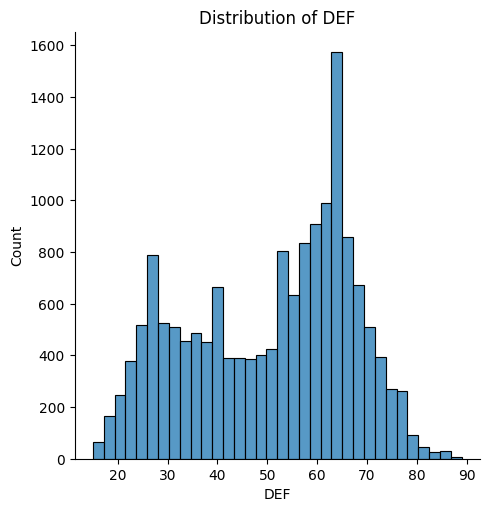

In [17]:
# Numerical

sns.displot(male_players['DEF'])
plt.title('Distribution of DEF')

In [18]:
male_players['DEF'].skew()

np.float64(-0.3029720686230267)

Text(0.5, 1.0, 'Box Plot of DEF')

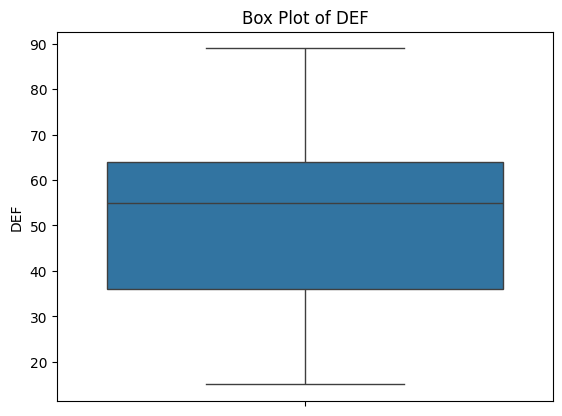

In [19]:
sns.boxplot(male_players['DEF'])
plt.title('Box Plot of DEF')

<Axes: xlabel='DEF', ylabel='PAC'>

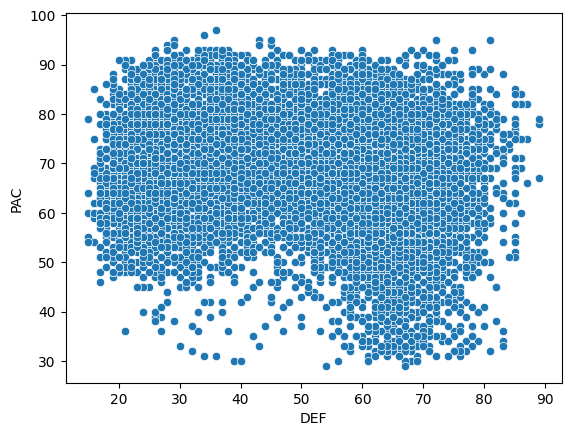

In [20]:
# BIVARIATE ANALYSIS

# numerical numerical

sns.scatterplot(data = male_players,x="DEF",y="PAC")

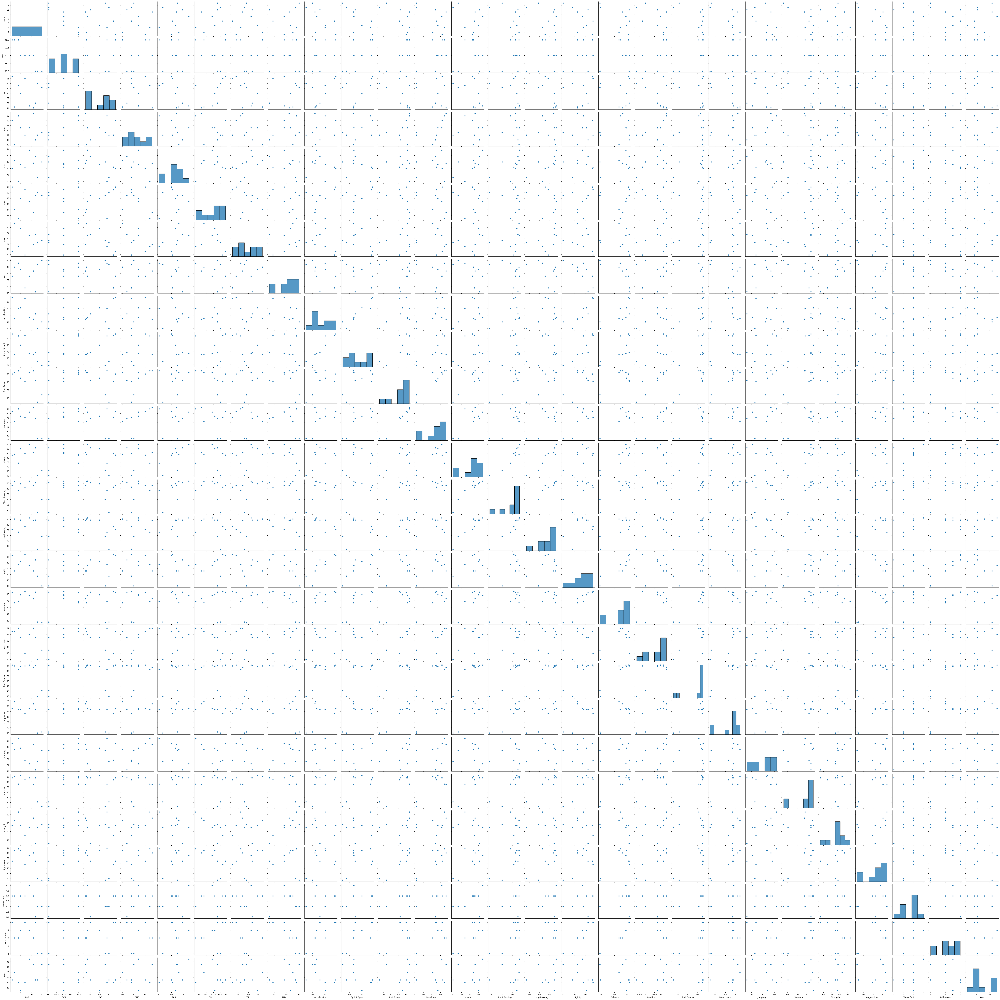

In [21]:
g = sns.pairplot(df)

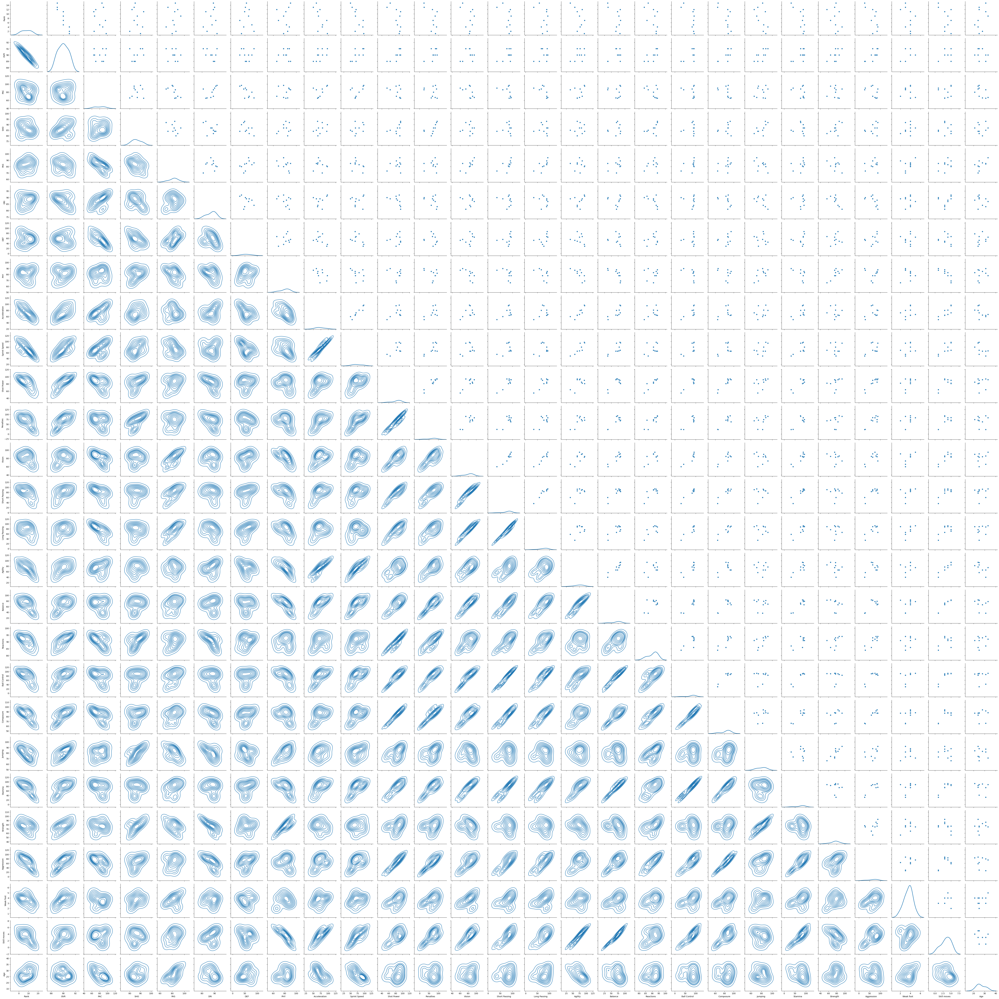

In [22]:
g = sns.PairGrid(df)
g = g.map_upper(sns.scatterplot)
g = g.map_lower(sns.kdeplot, colors="C0")
g = g.map_diag(sns.kdeplot, lw=2)

<Axes: xlabel='Weak foot', ylabel='DEF'>

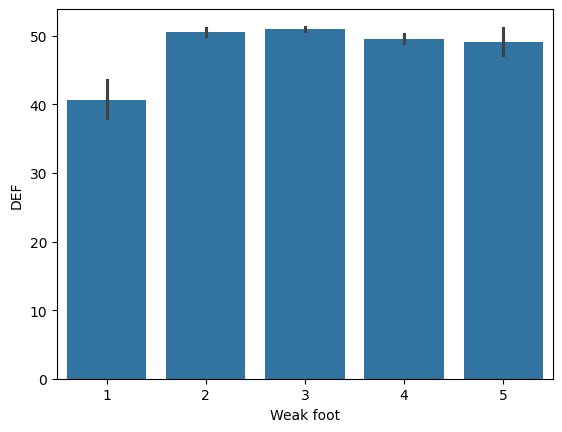

In [23]:
# categorical numerical
sns.barplot(data=male_players,x="Weak foot",y="DEF")

<Axes: xlabel='League', ylabel='Penalties'>

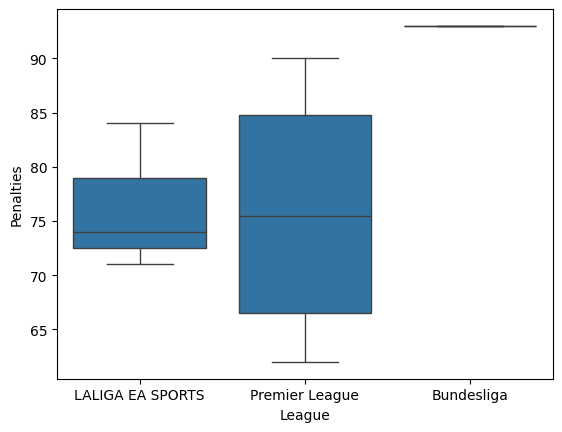

In [24]:
df1=male_players.head(8)
sns.boxplot(data=df1, x="League", y="Penalties")

C:\Users\manda\AppData\Local\Temp\ipykernel_16328\1356473465.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='League',y='Penalties',data=df1 ,palette='rainbow')


<Axes: xlabel='League', ylabel='Penalties'>

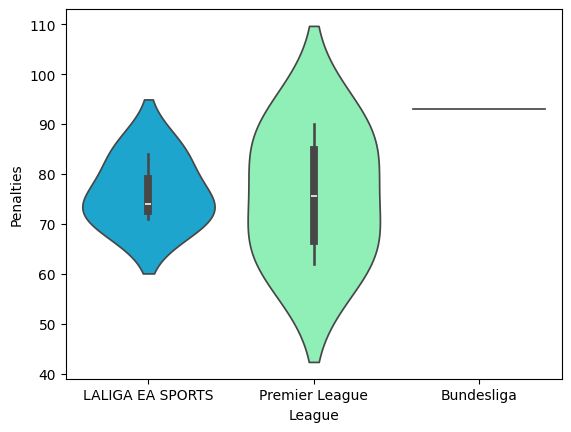

In [25]:
sns.violinplot(x='League',y='Penalties',data=df1 ,palette='rainbow')

In [26]:
# categorical categorical

pd.crosstab(male_players['League'],male_players['Finishing'])

Finishing,10,11,12,13,14,15,16,17,18,19,...,94,95,96,g3,g4,g5,g6,g7,g8,g9
League,,,,,,,,,,,,,,,,,,,,,
1A Pro League,3,6,3,1,1,3,1,3,1,2,...,0,0,0,0,2,3,7,8,6,5
3. Liga,0,0,2,2,0,3,1,2,7,9,...,0,0,0,0,3,7,5,9,13,12
3F Superliga,2,2,6,3,2,4,1,0,0,0,...,0,0,0,0,0,1,1,1,3,4
A-League,1,1,1,1,1,1,1,1,1,2,...,0,0,0,0,0,7,2,3,1,2
Allsvenskan,3,1,7,2,2,4,1,2,2,2,...,0,0,0,0,0,3,2,6,4,3
Bundesliga,3,5,5,5,4,3,2,3,1,1,...,0,1,0,0,2,2,3,6,8,8
Bundesliga 2,3,4,4,0,4,2,0,2,1,4,...,0,0,0,0,0,7,8,7,12,9
CSL,5,2,8,1,5,1,5,5,2,4,...,0,0,0,0,0,2,3,3,4,13
CSSL,3,1,2,4,1,1,2,0,2,1,...,0,0,0,0,1,1,4,5,2,5


<Axes: xlabel='Finishing', ylabel='Preferred foot'>

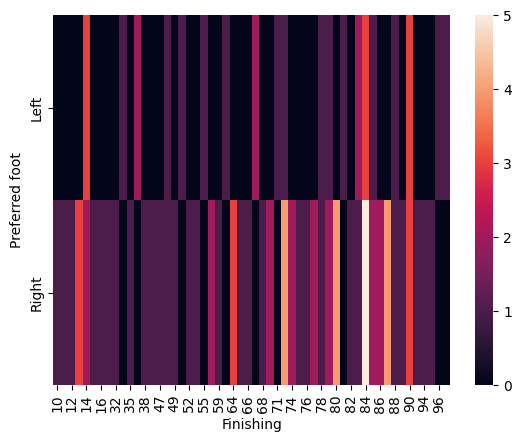

In [27]:
df2=male_players.head(100)
sns.heatmap(pd.crosstab(df2['Preferred foot'],df2['Finishing']))

In [28]:
# Option 1: Z-Score

z = np.abs(scipy.stats.zscore(male_players["DEF"]))
print(z)

#dropping outliers
male_players = male_players[(z < 3)]

0        0.893932
1        2.230422
2        0.342575
3        1.679066
4        1.322765
           ...   
16156    1.016455
16157    0.648884
16158    0.465099
16159    0.587622
16160    0.465099
Name: DEF, Length: 16161, dtype: float64


In [29]:
# chi 2 test caegorical and categorical

contigency= pd.crosstab(male_players['League'], male_players['Finishing']) 
contigency

Finishing,10,11,12,13,14,15,16,17,18,19,...,94,95,96,g3,g4,g5,g6,g7,g8,g9
League,,,,,,,,,,,,,,,,,,,,,
1A Pro League,3,6,3,1,1,3,1,3,1,2,...,0,0,0,0,2,3,7,8,6,5
3. Liga,0,0,2,2,0,3,1,2,7,9,...,0,0,0,0,3,7,5,9,13,12
3F Superliga,2,2,6,3,2,4,1,0,0,0,...,0,0,0,0,0,1,1,1,3,4
A-League,1,1,1,1,1,1,1,1,1,2,...,0,0,0,0,0,7,2,3,1,2
Allsvenskan,3,1,7,2,2,4,1,2,2,2,...,0,0,0,0,0,3,2,6,4,3
Bundesliga,3,5,5,5,4,3,2,3,1,1,...,0,1,0,0,2,2,3,6,8,8
Bundesliga 2,3,4,4,0,4,2,0,2,1,4,...,0,0,0,0,0,7,8,7,12,9
CSL,5,2,8,1,5,1,5,5,2,4,...,0,0,0,0,0,2,3,3,4,13
CSSL,3,1,2,4,1,1,2,0,2,1,...,0,0,0,0,1,1,4,5,2,5


In [30]:
c, p, dof, expected = chi2_contingency(contigency) 
print(p)

2.7369518160542586e-115


In [32]:
min_samples = 3
valid_groups = male_players.groupby().filter(lambda x: len(x) >= min_samples)
print(valid_groups)

NameError: name 'columns' is not defined

In [54]:
# t-test - Categorical and Numerical
tr=df.dropna(axis=0,how='any')
tr.describe()
a = tr.loc[tr['Weak foot'] == 'A', 'DEF'].to_numpy()
b = tr.loc[tr['Weak foot'] == 'B', 'DEF'].to_numpy()
st.ttest_ind(a=a, b=b, equal_var=True)

C:\Users\manda\AppData\Local\Temp\ipykernel_21620\97567120.py:6: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  st.ttest_ind(a=a, b=b, equal_var=True)


TtestResult(statistic=np.float64(nan), pvalue=np.float64(nan), df=np.float64(nan))

In [63]:
# ANOVA - Categorical and Numerical
print(cat)
print(num)
a = tr.loc[male_players['Standing Tackle'] == 'A', 'DEF'].to_numpy()
b = tr.loc[male_players['Standing Tackle'] == 'B', 'DEF'].to_numpy()
c = tr.loc[male_players['Standing Tackle'] == 'C', 'DEF'].to_numpy()
fvalue, pvalue = st.f_oneway(a,b,c)
print(fvalue, pvalue)

['Name', 'Positioning', 'Finishing', 'Long Shots', 'Volleys', 'Crossing', 'Free Kick Accuracy', 'Curve', 'Dribbling', 'Interceptions', 'Heading Accuracy', 'Def Awareness', 'Standing Tackle', 'Sliding Tackle', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot', 'Height', 'Weight', 'Nation', 'League', 'Team']
['OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'Acceleration', 'Sprint Speed', 'Shot Power', 'Penalties', 'Vision', 'Short Passing', 'Long Passing', 'Agility', 'Balance', 'Reactions', 'Ball Control', 'Composure', 'Jumping', 'Stamina', 'Strength', 'Aggression', 'Age']
nan nan


C:\Users\manda\AppData\Local\Temp\ipykernel_21620\1227395836.py:7: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  fvalue, pvalue = st.f_oneway(a,b,c)


In [64]:
# Linear - Numerical and Numerical
x = tr['DEF'].to_numpy()
y = tr['PAC'].to_numpy()
np.corrcoef(x, y)

array([[ 1.        , -0.70211309],
       [-0.70211309,  1.        ]])

In [66]:
#Z-score normalization
from sklearn.preprocessing import StandardScaler

# Drop missing values for simplicity
male_players.dropna(subset=['PAS'], inplace=True)

# Z-score normalization of the 'PAS' column
scaler = StandardScaler()
male_players['PAS_zscore'] = scaler.fit_transform(male_players[['PAS']])

# Display the first few rows
print(male_players[['PAS', 'PAS_zscore']].head())

   PAS  PAS_zscore
0   80    2.232335
1   86    2.853430
2   70    1.197175
3   83    2.542882
4   81    2.335850


In [67]:
# decimal scaling normalization

# Find the maximum absolute value in the PAS column
max_val = np.max(np.abs(male_players['PAS']))

# Calculate j (the smallest integer such that max(|x'|) < 1)
j = np.ceil(np.log10(max_val))

# Apply decimal scaling normalization
male_players['PAS_scaled'] = male_players['PAS'] / (10**j)

# Display the first few rows
print(male_players[['PAS', 'PAS_scaled']].head())

   PAS  PAS_scaled
0   80        0.80
1   86        0.86
2   70        0.70
3   83        0.83
4   81        0.81


In [68]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

# Normalize the variables
scaler = MinMaxScaler()
male_players[['OVR', 'PAC', 'SHO', 'PAS']] = scaler.fit_transform(male_players[['OVR', 'PAC', 'SHO', 'PAS']])

# Check the result
male_players.head()

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,...,Preferred foot,Height,Weight,Age,Nation,League,Team,url,PAS_zscore,PAS_scaled
0,1,Kylian Mbappé,1.000000,1.000000,0.958904,0.797101,92,36,78,97,...,Right,"182cm / 6'0""",75kg / 165lb,25,France,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.232335,0.80
1,2,Rodri,1.000000,0.544118,0.821918,0.884058,84,87,85,65,...,Right,"191cm / 6'3""",82kg / 181lb,28,Spain,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,2.853430,0.86
2,4,Erling Haaland,1.000000,0.867647,0.986301,0.652174,81,45,88,80,...,Left,"195cm / 6'5""",94kg / 207lb,24,Norway,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,1.197175,0.70
3,5,Jude Bellingham,0.977273,0.750000,0.917808,0.840580,88,78,83,81,...,Right,"186cm / 6'1""",75kg / 165lb,21,England,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.542882,0.83
4,7,Vini Jr.,0.977273,0.970588,0.876712,0.811594,91,29,69,95,...,Right,"176cm / 5'9""",73kg / 161lb,24,Brazil,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.335850,0.81


In [69]:
# Encode the Positioning variable
le = LabelEncoder()
male_players['Positioning'] = le.fit_transform(male_players['Positioning'])

# Check the result
male_players.head()

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,...,Preferred foot,Height,Weight,Age,Nation,League,Team,url,PAS_zscore,PAS_scaled
0,1,Kylian Mbappé,1.000000,1.000000,0.958904,0.797101,92,36,78,97,...,Right,"182cm / 6'0""",75kg / 165lb,25,France,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.232335,0.80
1,2,Rodri,1.000000,0.544118,0.821918,0.884058,84,87,85,65,...,Right,"191cm / 6'3""",82kg / 181lb,28,Spain,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,2.853430,0.86
2,4,Erling Haaland,1.000000,0.867647,0.986301,0.652174,81,45,88,80,...,Left,"195cm / 6'5""",94kg / 207lb,24,Norway,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,1.197175,0.70
3,5,Jude Bellingham,0.977273,0.750000,0.917808,0.840580,88,78,83,81,...,Right,"186cm / 6'1""",75kg / 165lb,21,England,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.542882,0.83
4,7,Vini Jr.,0.977273,0.970588,0.876712,0.811594,91,29,69,95,...,Right,"176cm / 5'9""",73kg / 161lb,24,Brazil,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.335850,0.81


In [70]:
# Aggregate the data by Positioning and get summary statistics
agg_df = male_players.groupby(['Positioning']).agg({'OVR': 'mean', 
                                      'PAC': 'mean', 
                                      'SHO': 'mean', 
                                      'PAS': 'mean'})

# Check the result
print(agg_df)

                  OVR       PAC       SHO       PAS
Positioning                                        
0            0.423110  0.547554  0.599027  0.546526
1            0.494898  0.586885  0.643975  0.587992
2            0.480088  0.579646  0.635471  0.582660
3            0.483798  0.581101  0.641123  0.588176
4            0.464286  0.565126  0.624444  0.578581
...               ...       ...       ...       ...
88           0.341812  0.503506  0.555929  0.497936
89           0.357012  0.508424  0.569216  0.513874
90           0.350160  0.498892  0.564810  0.513000
91           0.357158  0.505566  0.568173  0.519504
92           0.399476  0.534078  0.589436  0.539298

[93 rows x 4 columns]


In [71]:
# Log-transform the OVR and PAC
male_players['OVR'] = np.log(male_players['PAC'])
male_players['PAC'] = np.log(df['OVR'])

# Check the result
print(male_players.head(20))

    Rank                   Name       OVR       PAC       SHO       PAS  DRI  \
0      1          Kylian Mbappé  0.000000  4.510860  0.958904  0.797101   92   
1      2                  Rodri -0.608590  4.510860  0.821918  0.884058   84   
2      4         Erling Haaland -0.141970  4.510860  0.986301  0.652174   81   
3      5        Jude Bellingham -0.287682  4.499810  0.917808  0.840580   88   
4      7               Vini Jr. -0.029853  4.499810  0.876712  0.811594   91   
5      9        Kevin De Bruyne -0.581922  4.499810  0.917808  1.000000   87   
6     11             Harry Kane -0.635989  4.499810  1.000000  0.855072   83   
7     12        Martin Ødegaard -0.505936  4.488636  0.849315  0.927536   89   
8     13   Gianluigi Donnarumma -0.108634  4.488636  0.876712  0.695652   90   
9     15                Alisson -0.176456  4.488636  0.890411  0.869565   89   
10    16       Thibaut Courtois -0.194156       NaN  0.945205  0.739130   90   
11    18       Lautaro Martínez -0.24921

c:\Users\manda\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [72]:
# Scale the variables
scaler = StandardScaler()
df[['OVR', 'PAC', 'SHO', 'PAS']] = scaler.fit_transform(df[['OVR', 'PAC', 'SHO', 'PAS']])

# Check the result
print(df.head())

   Rank             Name       OVR       PAC       SHO       PAS  DRI  DEF  \
0     1    Kylian Mbappé  1.290994  1.401755  0.893325 -0.372471   92   36   
1     2            Rodri  1.290994 -1.215980 -1.588133  0.521460   84   87   
2     4   Erling Haaland  1.290994  0.641767  1.389617 -1.862356   81   45   
3     5  Jude Bellingham  0.000000 -0.033777  0.148888  0.074494   88   78   
4     7         Vini Jr.  0.000000  1.232869 -0.595550 -0.223483   91   29   

   PHY  Acceleration  ...  Weak foot Skill moves Preferred foot        Height  \
0   78            97  ...          4           5          Right  182cm / 6'0"   
1   85            65  ...          4           3          Right  191cm / 6'3"   
2   88            80  ...          3           3           Left  195cm / 6'5"   
3   83            81  ...          4           4          Right  186cm / 6'1"   
4   69            95  ...          4           5          Right  176cm / 5'9"   

         Weight Age   Nation            Leag